# Description of the Dataset

The dataset used in this project is the "Spaghetti Detector" dataset from Roboflow, which contains images of a common 3D printing failure. This failure occurs when a print detaches from the print bed, causing the printer to continue extruding filament into the air, creating a tangled mess known as "spaghetti." These failures should be detected early, as they waste material and can lead to more serious issues. If unnoticed, the extruded filament can clog the nozzle, which in turn may pose a fire hazard due to overheating.

While the images in the dataset are not taken from live surveillance cameras, they resemble the kind of poor-quality footage typically captured by low-end webcams often used to monitor 3D printers. The print beds are usually moving, and lighting is uncontrolled, resulting in blurry, low-resolution, and inconsistent images. This degraded image quality is representative of what would be expected in real-world monitoring setups, which makes the dataset suitable for developing approaches that could later be applied to camera-based printer surveillance.

As an additional challenge, the print bed often includes grid lines or patterned surfaces that can interfere with segmentation by creating misleading edges or textures. In many cases, other objects such as cables, tools, or loose parts are also visible in the frame, cluttering the background and complicating the detection of the actual printing failure.

# Data pre-processing

Since two different approaches were used in the project, separate data pre-processing steps were required for each, as described below.

# Manual Segmentation
The software QuPath was used for the manual image segmentation. QuPath was chosen, as it was one of the recommended options and it was found to be the easiest of them to install on Linux. Eleven images were manually segmented without any pre-processing.

The dataset also includes annotated images, but the annotations are only rough boxes around the structures.

# Second Approach using a Frangi Method

In this approach, the images were first sharpened using a custom kernel to enhance edges and highlight fine structures. This improved contrast at object boundaries and helped later processing steps. The sharpened images were then converted to grayscale to reduce complexity. A Frangi filter was applied to enhance curvilinear, line-like features common in the target structures. The Frangi response was thresholded to produce a binary mask, separating enhanced structures from the background. A circularity filter was used to remove irregular and elongated shapes, keeping mainly round ones and helping to exclude artifacts like grid lines. Morphological dilation was optionally applied to fill gaps and improve shape continuity.

For evaluation, manually labeled images were used. These annotations were made in QuPath and exported as GeoJSON files. They were loaded and converted to binary masks matching the dimensions of the input images. The predicted masks were compared to the manual ones using Intersection over Union (IoU), Dice coefficient, and pixel accuracy. These metrics quantify overlap and provide a measure of how well the automated method matches the manual segmentation.

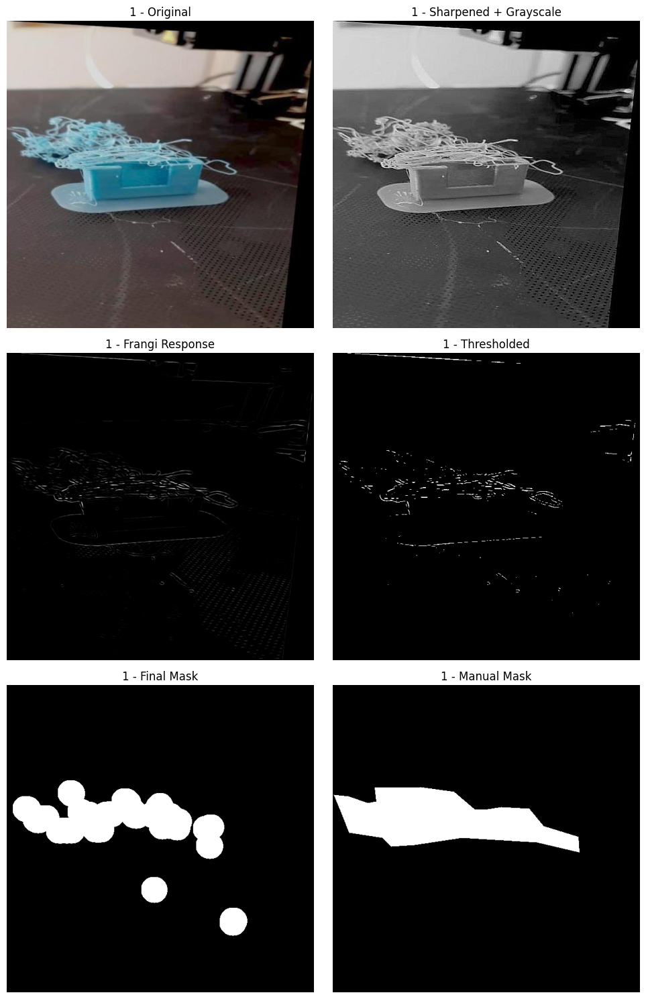

Image 1 - IoU: 0.586, Dice: 0.739, Accuracy: 0.951


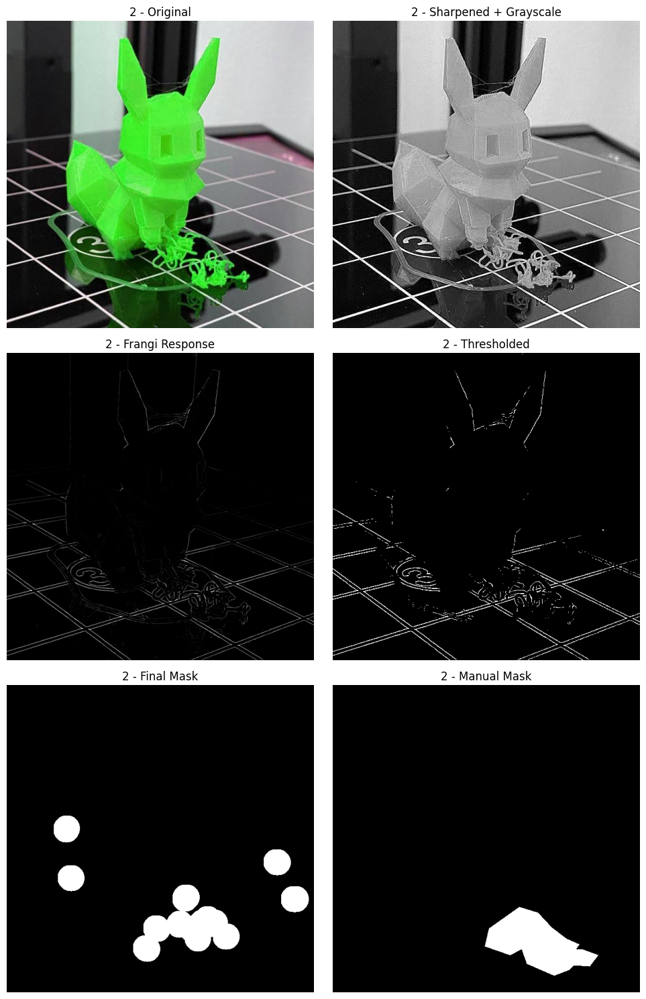

Image 2 - IoU: 0.238, Dice: 0.385, Accuracy: 0.934


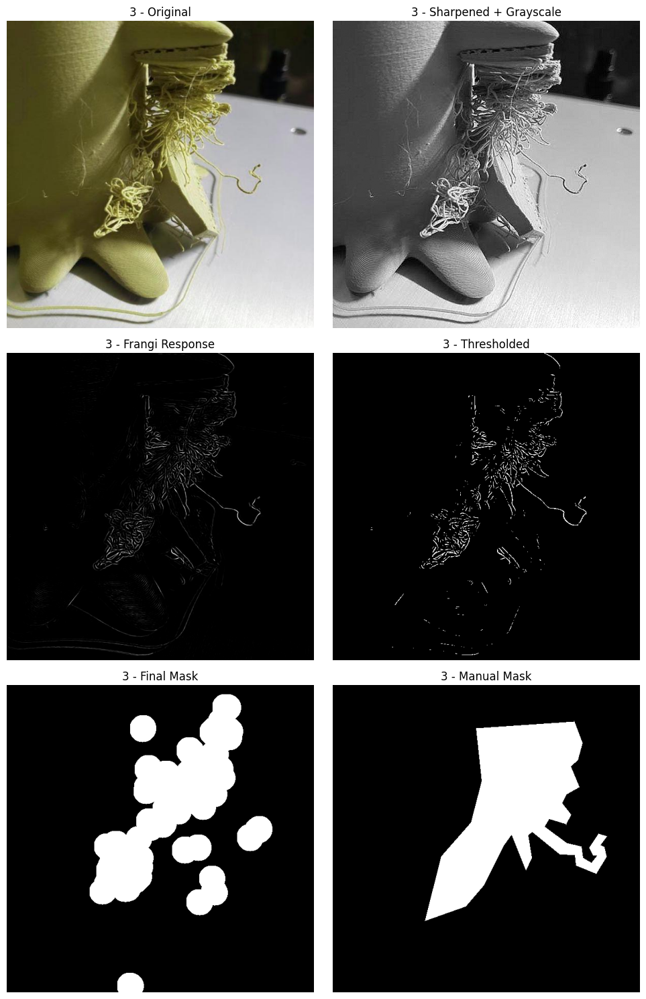

Image 3 - IoU: 0.430, Dice: 0.601, Accuracy: 0.863


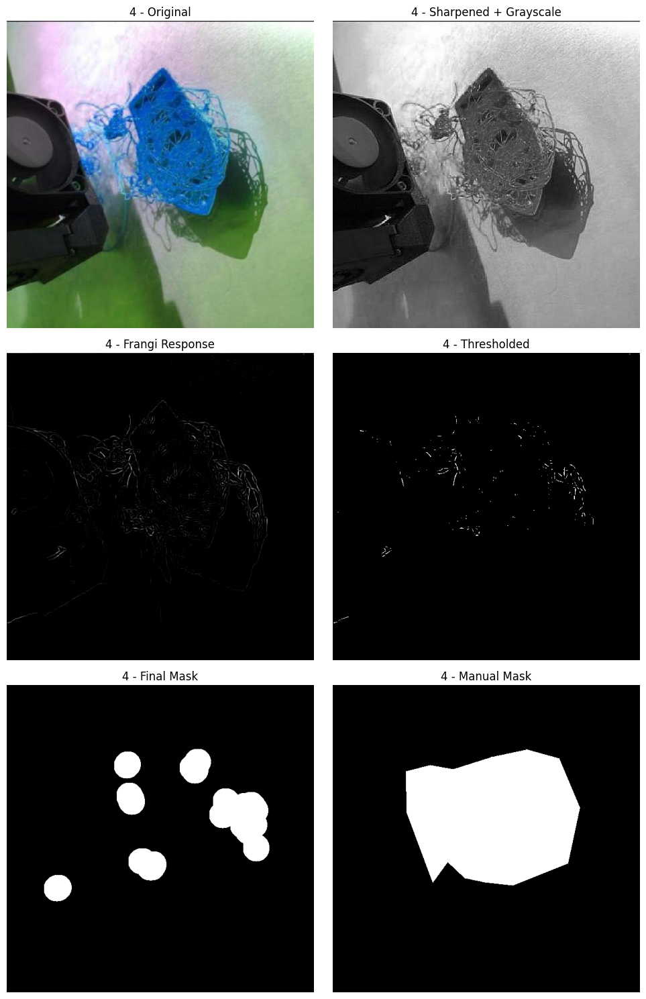

Image 4 - IoU: 0.210, Dice: 0.348, Accuracy: 0.828


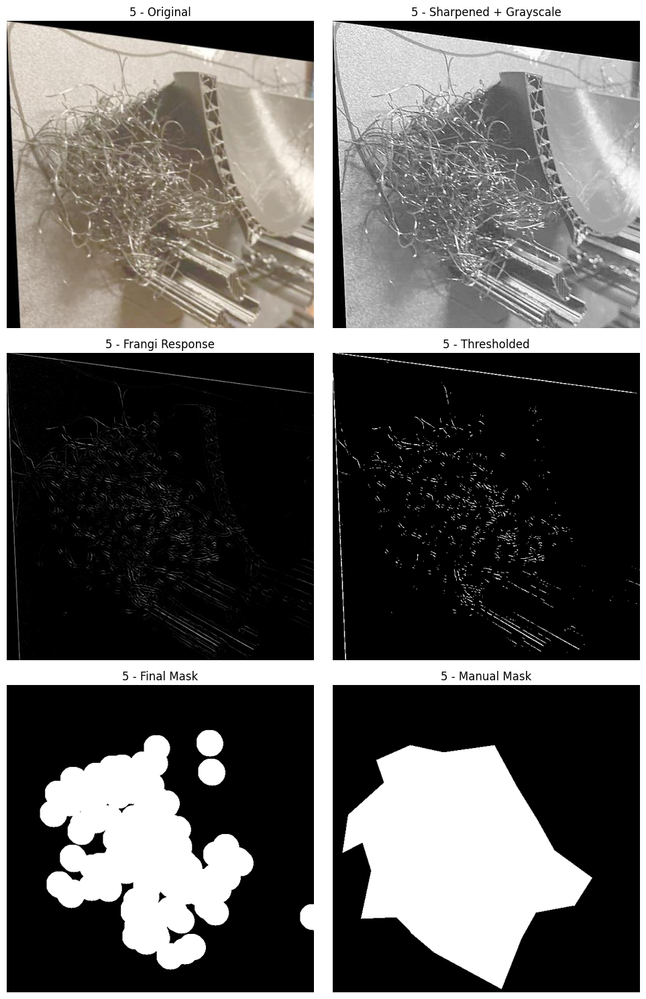

Image 5 - IoU: 0.639, Dice: 0.779, Accuracy: 0.854


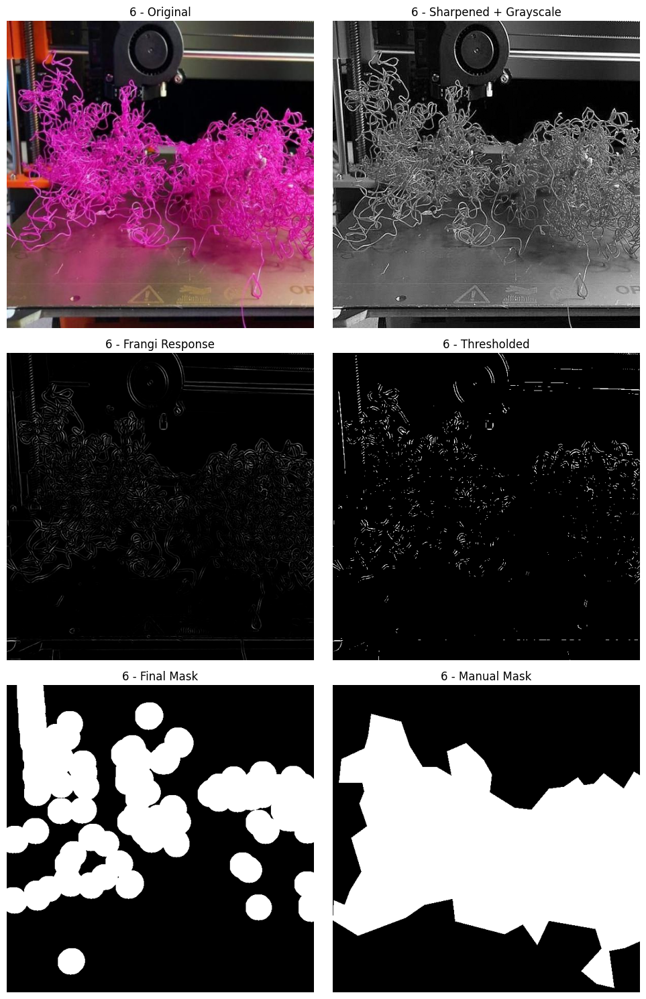

Image 6 - IoU: 0.423, Dice: 0.595, Accuracy: 0.668


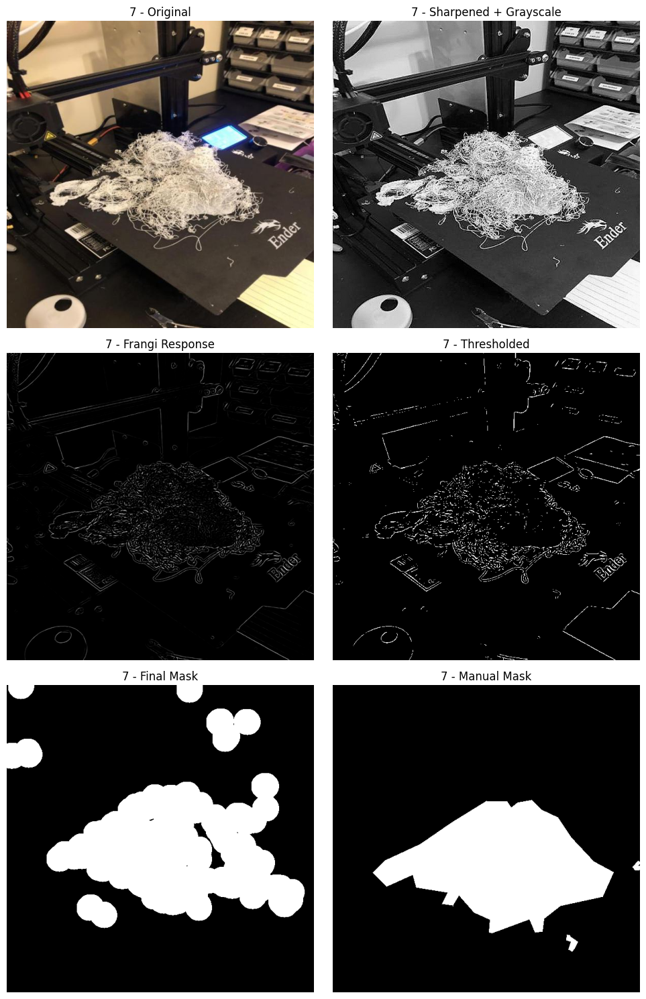

Image 7 - IoU: 0.537, Dice: 0.699, Accuracy: 0.861


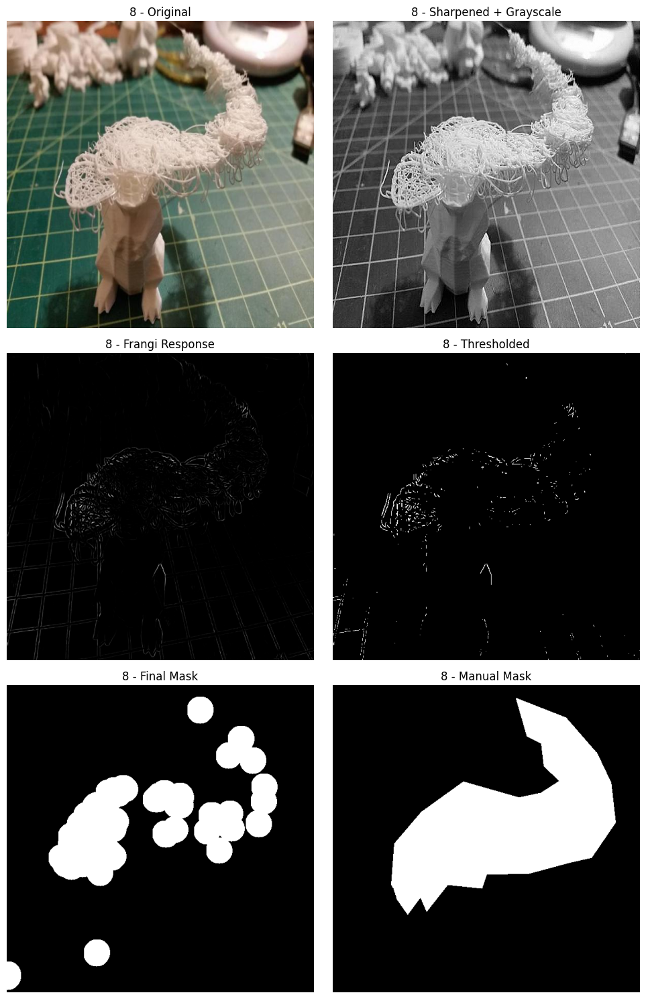

Image 8 - IoU: 0.446, Dice: 0.617, Accuracy: 0.848


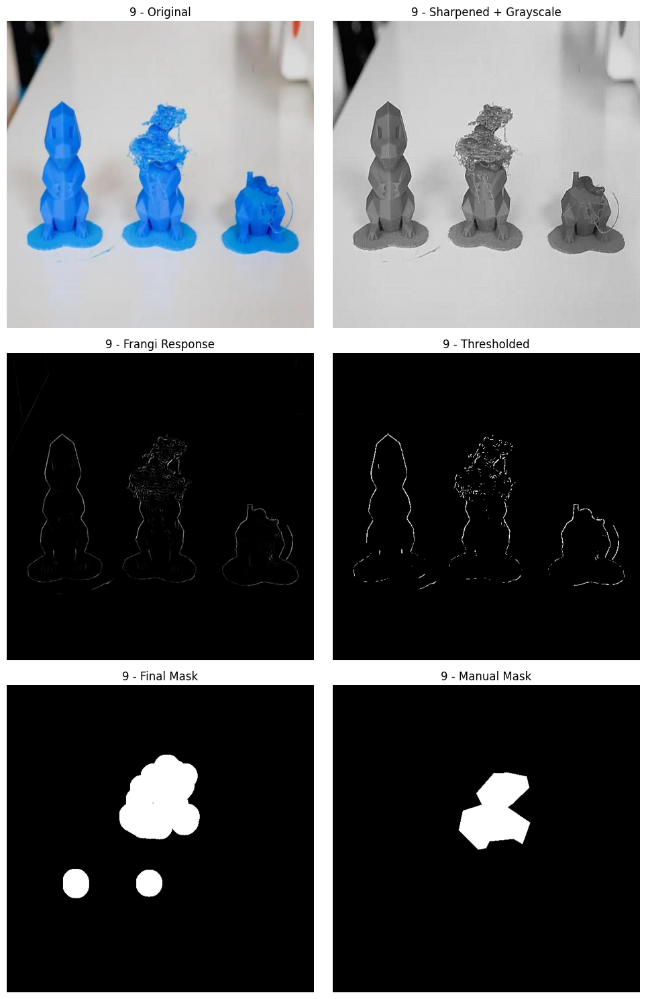

Image 9 - IoU: 0.425, Dice: 0.597, Accuracy: 0.958


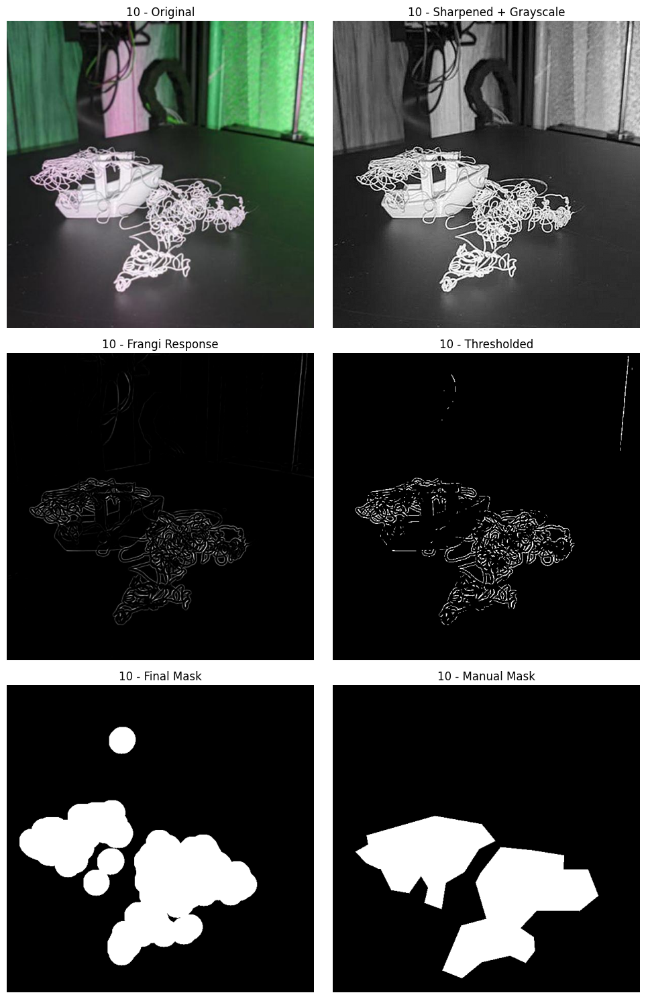

Image 10 - IoU: 0.532, Dice: 0.694, Accuracy: 0.888


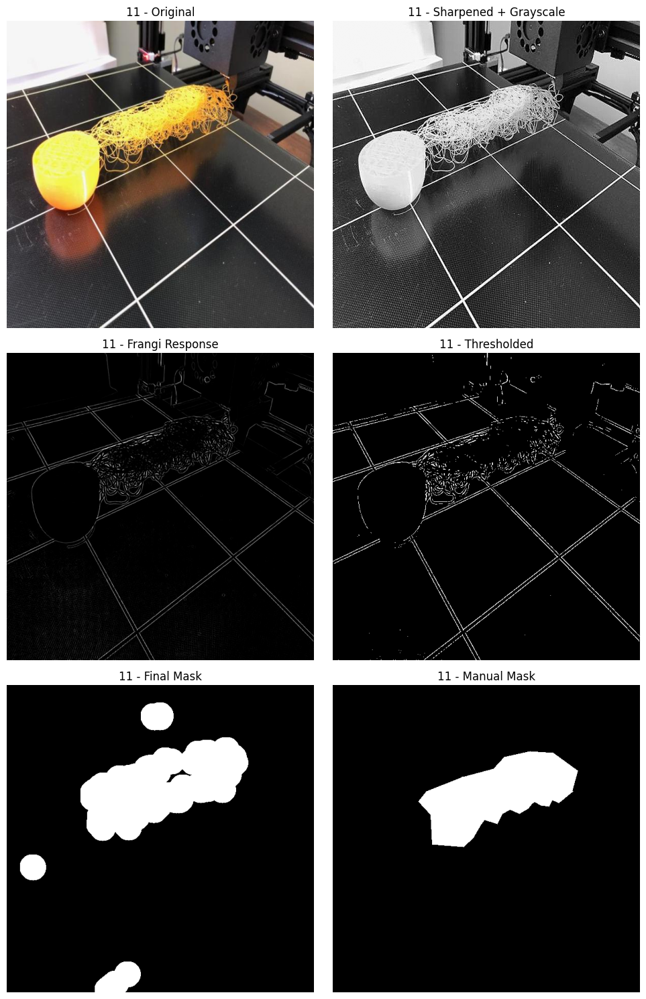

Image 11 - IoU: 0.515, Dice: 0.679, Accuracy: 0.930

Mean IoU: 0.453, Mean Dice: 0.612, Mean Accuracy: 0.871


In [1]:
import cv2
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import frangi
from skimage import img_as_float
import json
from PIL import Image, ImageDraw

# --- Parameters ---
BASE_DIR = "data_frangi"

FRANGI_THRESHOLD = 0.2
MIN_CIRCULARITY = 0.2
DILATE_KERNEL_SIZE = 50  # set to 0 to disable dilation


# --- Helper Functions ---
def sharpen_image(img):
    kernel = np.array([[0, -1, 0],
                       [-1, 5, -1],
                       [0, -1, 0]])
    return cv2.filter2D(img, -1, kernel)

def show_comparison(imgs, titles, per_row=2):
    n = len(imgs)
    rows = (n + per_row - 1) // per_row
    fig, axs = plt.subplots(rows, per_row, figsize=(5 * per_row, 5 * rows))
    axs = axs.flatten()

    for i in range(n):
        ax = axs[i]
        img = imgs[i]
        if len(img.shape) == 2:
            ax.imshow(img, cmap='gray')
        else:
            ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax.set_title(titles[i])
        ax.axis('off')

    for i in range(n, len(axs)):
        axs[i].axis("off")

    plt.tight_layout()
    plt.show()

def filter_round_shapes(binary_mask, min_circularity=0.2):
    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    clean = np.zeros_like(binary_mask)
    for c in contours:
        area = cv2.contourArea(c)
        perimeter = cv2.arcLength(c, True)
        if perimeter == 0:
            continue
        circularity = 4 * np.pi * area / (perimeter ** 2)
        if circularity > min_circularity:
            cv2.drawContours(clean, [c], -1, 255, cv2.FILLED)
    return clean


# --- Load GT mask from GeoJSON ---
def load_geojson_mask(index, shape):
    path = os.path.join(BASE_DIR, f"{index}.geojson")

    with open(path) as f:
        data = json.load(f)

    mask = Image.new('L', (shape[1], shape[0]), 0)
    draw = ImageDraw.Draw(mask)

    for feature in data['features']:
        coords = feature['geometry']['coordinates']

        # Handle both Polygon and MultiPolygon structures
        if feature['geometry']['type'] == 'Polygon':
            polys = [coords]
        elif feature['geometry']['type'] == 'MultiPolygon':
            polys = coords
        else:
            print(f"Skipping unsupported geometry type in {path}")
            continue

        for poly in polys:
            try:
                # Only first ring (outer boundary)
                xy = [tuple(map(int, pt)) for pt in poly[0] if len(pt) == 2]
                draw.polygon(xy, outline=255, fill=255)
            except Exception as e:
                print(f"Skipping polygon in {path}: {e}")
                continue

    return np.array(mask)

# --- Metric calculation ---
def evaluate_masks(pred, gt):
    pred_bin = (pred > 0).astype(np.uint8)
    gt_bin = (gt > 0).astype(np.uint8)

    intersection = np.logical_and(pred_bin, gt_bin).sum()
    union = np.logical_or(pred_bin, gt_bin).sum()
    iou = intersection / union if union > 0 else 0

    dice = 2 * intersection / (pred_bin.sum() + gt_bin.sum()) if (pred_bin.sum() + gt_bin.sum()) > 0 else 0
    accuracy = (pred_bin == gt_bin).sum() / pred_bin.size

    return {"IoU": iou, "Dice": dice, "Pixel Acc": accuracy}


# --- Main Processing ---
pattern = os.path.join(BASE_DIR, "*.jpg")
paths = sorted(glob.glob(pattern), key=lambda p: int(os.path.splitext(os.path.basename(p))[0]))
all_scores = []


for path in paths:
    img = cv2.imread(path)
    filename = os.path.basename(path)
    index = int(os.path.splitext(filename)[0])
    title = str(index)


    # Step 1: Sharpen
    sharp = sharpen_image(img)

    # Step 2: Grayscale + Frangi
    gray = cv2.cvtColor(sharp, cv2.COLOR_BGR2GRAY)
    gray_float = img_as_float(gray)
    frangi_response = frangi(gray_float)

    # Step 3: Threshold
    binary = (frangi_response > FRANGI_THRESHOLD).astype(np.uint8) * 255

    # Step 4: Filter roundish shapes
    filtered = filter_round_shapes(binary, min_circularity=MIN_CIRCULARITY)

    # Step 5: Optional dilation
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (DILATE_KERNEL_SIZE, DILATE_KERNEL_SIZE))
    filtered = cv2.dilate(filtered, kernel)

    # Step 6: Show everything
    gt_mask = load_geojson_mask(index, filtered.shape)
    show_comparison(
        [img,
         gray,
         (frangi_response * 255).astype(np.uint8),
         binary,
         filtered,
         gt_mask],
        [f"{title} - Original",
         f"{title} - Sharpened + Grayscale",
         f"{title} - Frangi Response",
         f"{title} - Thresholded",
         f"{title} - Final Mask",
         f"{title} - Manual Mask"]
    )

    # Step 7: Evaluate
    scores = evaluate_masks(filtered, gt_mask)
    print(f"Image {index} - IoU: {scores['IoU']:.3f}, Dice: {scores['Dice']:.3f}, Accuracy: {scores['Pixel Acc']:.3f}")
    all_scores.append(scores)


mean_iou = np.mean([s["IoU"] for s in all_scores])
mean_dice = np.mean([s["Dice"] for s in all_scores])
mean_acc = np.mean([s["Pixel Acc"] for s in all_scores])
print(f"\nMean IoU: {mean_iou:.3f}, Mean Dice: {mean_dice:.3f}, Mean Accuracy: {mean_acc:.3f}")

